## an exploration of members of US congress

- average age over time
- net worth over time
- district lines
- voting history

In [60]:
# imports (maybe do imports in other files? do i need to?)
# put checks perhaps
import numpy as np
import pandas as pd
import yaml

from datetime import datetime

import matplotlib
import matplotlib.pyplot as plt




In [2]:
current_fp = 'data/legislators-current.yaml'
historic_fp= 'data/legislators-historical.yaml'

with open(current_fp) as f:
    yaml_contents = yaml.load(f, Loader=yaml.SafeLoader)
    current_df = pd.json_normalize(yaml_contents)
    
with open(historic_fp) as f:
    yaml_contents = yaml.load(f, Loader=yaml.SafeLoader)
    historic_df = pd.json_normalize(yaml_contents)
    
all_leg_df = pd.concat([current_df, historic_df])

In [ ]:
def get_yearlist_from_term(termlist):
    '''
    this function should return a list of integer years when given a start and end
    '''
    # take a list of dicts and convert to list of int year
    yearlist = []
    ## TODO is this where the nan years are being added???? double check
    
    
    for t in termlist:
        currentyear = int(t['start'][:4]) # just the year -> int
        endyear = int(t['end'][:4])
        
        while currentyear != endyear:
            yearlist.append(currentyear)
            currentyear+=1
            
            # if currentyear
            
    return yearlist

def age_helper(birthday_str, current_year):
    '''
    age as of just past election; december 1 of that year.
    
    birthday
        str
        YYYY-MM-DD
    
    '''
    try:
    
        date_format = "%Y-%m-%d"
        
        current_date_str = str(current_year) + "-01-01"
        
        # Convert string dates to datetime objects
        current_date = datetime.strptime(str(current_date_str), date_format)
        
        birthday = datetime.strptime(str(birthday_str), date_format)
        
        # Calculate the age
        return current_date.year - birthday.year
    except Exception as e:
        print(e)
        print(current_year)






In [65]:
temp_age_df = all_leg_df[['name.first', 'name.last', 'bio.birthday', 'bio.gender', 'terms']]

temp_age_df['year'] = temp_age_df['terms'].apply(get_yearlist_from_term)

# temp_age_df['myuniqueid'] = temp_age_df.index # before explode?

temp_age_df = temp_age_df.explode('year')

# pull out nan dataframes for testing
birthday_nan_age_df = temp_age_df[temp_age_df['bio.birthday'].isna()]
year_nan_age_df = temp_age_df[temp_age_df['year'].isna()]

# drop nan rows for calculation
temp_age_df = temp_age_df.dropna(subset=['bio.birthday', 'year'], ignore_index=True)#, inplace=True) # inplace breaks?

# calculate age
bday_format = "%Y-%m-%d"
temp_age_df['age'] = temp_age_df.apply(lambda row: age_helper(row['bio.birthday'], row['year']), axis=1)


yearly_mean = temp_age_df.groupby(['year'])['age'].mean()





# temp_age_df
yearly_mean



/var/folders/nh/r982cbh14gl7d4zw7_82vhlw0000gn/T/ipykernel_37938/2327777426.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_age_df['year'] = temp_age_df['terms'].apply(get_yearlist_from_term)


year
1789    45.328767
1790    45.924051
1791    43.543210
1792    44.475610
1793    42.616822
          ...    
2024    59.751391
2025    65.059701
2026    66.059701
2027    65.441176
2028    66.441176
Name: age, Length: 240, dtype: float64

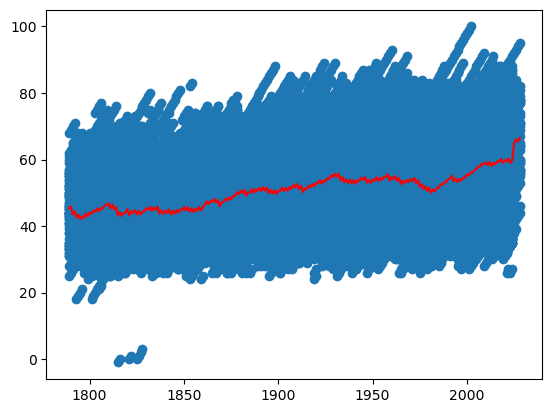

In [66]:
fig, ax = plt.subplots()

ax.scatter(
    temp_age_df['year'],
    temp_age_df['age'],
)

ax.plot(
    yearly_mean.index,
    yearly_mean.values,
    c='r'
)




In [ ]:
# setup column
temp_age_df['years in office'] = temp_age_df['terms'].apply(get_yearlist_from_term)
# get earliest and latest year
## temp hardcode
earliest_year = 1789 # pull from the actual data
this_year = 2024 ## pull from data

l_year = []
l_age = []
l_gender = []
l_party = []
l_namef = []
l_namel = []

for i in range(earliest_year, this_year+1):
    # this can probably be cut into a single step
    
    ## if year in 'years in office' for a given row, append to dict
    
    
    
    
    # temp_age_df[str(i)] = temp_age_df['years in office'].apply(lambda x: 1 if i in x else 0)





age_df = pd.DataFrame.from_dict({
    "year": l_year,
    # 'age': l_age,
    # 'gender': l_gender,
    # 'party': l_party,
    # 'firstname': l_namef,
    # 'lastname': l_namel
})

/var/folders/nh/r982cbh14gl7d4zw7_82vhlw0000gn/T/ipykernel_32796/146132327.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  age_df['years in office'] = age_df['terms'].apply(get_yearlist_from_term)
/var/folders/nh/r982cbh14gl7d4zw7_82vhlw0000gn/T/ipykernel_32796/146132327.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  age_df[str(i)] = age_df['years in office'].apply(lambda x: 1 if i in x else 0)
/var/folders/nh/r982cbh14gl7d4zw7_82vhlw0000gn/T/ipykernel_32796/146132327.py:10: SettingWithCopyWarning

,name.first,name.last,bio.birthday,bio.gender,terms,years in office,1789,1790,1791,1792,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
0,Sherrod,Brown,1952-11-09,M,"[{'type': 'rep', 'start': '1993-01-05', 'end':...","[1993, 1994, 1995, 1996, 1997, 1998, 1999, 200...",0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
1,Maria,Cantwell,1958-10-13,F,"[{'type': 'rep', 'start': '1993-01-05', 'end':...","[1993, 1994, 2001, 2002, 2003, 2004, 2005, 200...",0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
2,Benjamin,Cardin,1943-10-05,M,"[{'type': 'rep', 'start': '1987-01-06', 'end':...","[1987, 1988, 1989, 1990, 1991, 1992, 1993, 199...",0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
3,Thomas,Carper,1947-01-23,M,"[{'type': 'rep', 'start': '1983-01-03', 'end':...","[1983, 1984, 1985, 1986, 1987, 1988, 1989, 199...",0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
4,Robert,Casey,1960-04-13,M,"[{'type': 'sen', 'start': '2007-01-04', 'end':...","[2007, 2008, 2009, 2010, 2011, 2012, 2013, 201...",0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [5]:
test = pd.DataFrame({
    'ID': [1, 2, 3],
    'Name': ['Alice', 'Bob', 'Charlie'],
    'Scores': [[85, 90, 92], [78, 80], [95, 88, 91, 93]]
})

In [9]:
test.explode(column='Scores')#, ignore_index=True)

,ID,Name,Scores
0,1,Alice,85
0,1,Alice,90
0,1,Alice,92
1,2,Bob,78
1,2,Bob,80
2,3,Charlie,95
2,3,Charlie,88
2,3,Charlie,91
2,3,Charlie,93


In [17]:
all_years = list(range(earliest_year, this_year+1))

member_count = []
avg_age = []

for i in all_years:
    year_df = all_leg_df.loc[all_leg_df[str(i)] == 1]
    year_df['age'] = year_df.apply(
        lambda x: age_helper(x['bio.birthday'], i),
        axis=1
    )

    member_count.append(all_leg_df[str(i)].sum())
    avg_age.append(year_df['age'].mean()) # median?
    
    
count_dict = {
    'year': all_years,
    'member count': member_count
}
count_df = pd.DataFrame.from_dict(count_dict)


# count_df.plot(
#     x='year',
#     # y='member_count'
# )

ValueError: time data 'nan' does not match format '%Y-%m-%d'

In [8]:
count_df

,year,member count
0,1789,89
1,1790,95
2,1791,98
3,1792,101
4,1793,139
...,...,...
231,2020,536
232,2021,540
233,2022,536
234,2023,540


In [18]:
historic_df.loc[historic_df['1918'] == 1]

,terms,id.bioguide,id.govtrack,id.icpsr,id.wikipedia,id.wikidata,id.google_entity_id,name.first,name.last,bio.birthday,...,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
7047,"[{'type': 'rep', 'start': '1883-12-03', 'end':...",G000255,404617,3646.0,Nathan Goff Jr.,Q926876,kg:/m/05xv8w,Nathan,Goff,1843-02-09,...,0,0,0,0,0,0,0,0,0,0
7058,"[{'type': 'sen', 'start': '1913-04-07', 'end':...",H000727,405578,4525.0,Henry F. Hollis,Q1606718,kg:/m/0d5ydn,Henry,Hollis,1869-08-30,...,0,0,0,0,0,0,0,0,0,0
7060,"[{'type': 'rep', 'start': '1903-11-09', 'end':...",H000929,405774,4707.0,William Hughes (U.S. senator),Q2579376,kg:/m/0d36w5,William,Hughes,1872-04-03,...,0,0,0,0,0,0,0,0,0,0
7061,"[{'type': 'rep', 'start': '1903-11-09', 'end':...",J000051,405956,4885.0,Ollie Murray James,Q381568,kg:/m/093jrx,Ollie,James,1871-07-27,...,0,0,0,0,0,0,0,0,0,0
7088,"[{'type': 'sen', 'start': '1895-12-02', 'end':...",M000200,407220,6040.0,Thomas S. Martin,Q1168633,kg:/m/08ljrw,Thomas,Martin,1847-07-29,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9470,"[{'type': 'rep', 'start': '1913-04-07', 'end':...",B000145,401146,437.0,Alben W. Barkley,Q273549,kg:/m/0myyb,Alben,Barkley,1877-11-24,...,0,0,0,0,0,0,0,0,0,0
9509,"[{'type': 'rep', 'start': '1913-04-07', 'end':...",N000023,408115,6856.0,Matthew M. Neely,Q363974,kg:/m/05dr13,Matthew,Neely,1874-11-09,...,0,0,0,0,0,0,0,0,0,0
9755,"[{'type': 'rep', 'start': '1913-04-07', 'end':...",R000082,409062,7753.0,Sam Rayburn,Q1378052,kg:/m/024zwq,Samuel,Rayburn,1882-01-06,...,0,0,0,0,0,0,0,0,0,0
9818,"[{'type': 'rep', 'start': '1911-04-04', 'end':...",H000385,405253,4227.0,Carl Hayden,Q963401,kg:/m/02rzt9,Carl,Hayden,1877-10-02,...,0,0,0,0,0,0,0,0,0,0


In [33]:
all_leg_df = pd.concat(
    [current_df,
    historic_df]
)

all_leg_df

,terms,id.bioguide,id.thomas,id.lis,id.govtrack,id.opensecrets,id.votesmart,id.fec,id.cspan,id.wikipedia,...,2019,2020,2021,2022,2023,2024,id.bioguide_previous,id.house_history_alternate,other_names,id.pictorial
0,"[{'type': 'rep', 'start': '1993-01-05', 'end':...",B000944,00136,S307,400050,N00003535,27018.0,"[H2OH13033, S6OH00163]",5051.0,Sherrod Brown,...,1,1,1,1,1,1,NaN,NaN,NaN,NaN
1,"[{'type': 'rep', 'start': '1993-01-05', 'end':...",C000127,00172,S275,300018,N00007836,27122.0,"[S8WA00194, H2WA01054]",26137.0,Maria Cantwell,...,1,1,1,1,1,1,NaN,NaN,NaN,NaN
2,"[{'type': 'rep', 'start': '1987-01-06', 'end':...",C000141,00174,S308,400064,N00001955,26888.0,"[H6MD03177, S6MD03177]",4004.0,Ben Cardin,...,1,1,1,1,1,1,NaN,NaN,NaN,NaN
3,"[{'type': 'rep', 'start': '1983-01-03', 'end':...",C000174,00179,S277,300019,N00012508,22421.0,[S8DE00079],663.0,Tom Carper,...,1,1,1,1,1,1,NaN,NaN,NaN,NaN
4,"[{'type': 'sen', 'start': '2007-01-04', 'end':...",C001070,01828,S309,412246,N00027503,2541.0,[S6PA00217],47036.0,Bob Casey Jr.,...,1,1,1,1,1,1,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12146,"[{'type': 'rep', 'start': '1997-01-07', 'end':...",P000096,01510,NaN,400309,N00000751,478.0,[H6NJ08118],45543.0,Bill Pascrell,...,1,1,1,1,1,0,NaN,NaN,NaN,NaN
12147,"[{'type': 'rep', 'start': '1993-01-05', 'end':...",M000639,00791,S306,400272,N00000699,26961.0,"[H2NJ13075, S6NJ00289]",29608.0,Bob Menendez,...,1,1,1,1,1,0,NaN,NaN,[{'last': 'Menendez'}],NaN
12148,"[{'type': 'rep', 'start': '2017-01-03', 'end':...",G000578,NaN,NaN,412690,N00039503,117101.0,[H6FL01119],104528.0,Matt Gaetz,...,1,1,1,1,1,0,NaN,NaN,NaN,NaN
12149,"[{'type': 'sen', 'start': '2023-10-03', 'end':...",B001320,NaN,S424,456954,NaN,NaN,NaN,NaN,Laphonza Butler,...,0,0,0,0,1,0,NaN,NaN,NaN,13436.0


In [2]:
def load_legislators(which='all',filetype='yaml'):
    
    
    
    legislator_cols = [
        
        'first_name',
        'middle_name',
        'last_name',
        'birthday',
        'gender',
        'term_start',
        'term_end',
        
    ]
    leg_terms = [
        'first_name',   # names are for matching across dfs
        'middle_name',
        'last_name',
        'birthday',     # 
        'type',         # rep | sen
        'party',
        'term_start',
        'term_end',
        'state',
        'district',
        # 'sen_details',  # senate term?
    ]
    
    
    
    
    
    
    
    
    
    col_names = [
        
    ]
    
    
    
    
    df = pd.DataFrame
    
    
    return df

In [3]:
# v1; use csv directly
current_fp = 'data/legislators-current.yaml'

with open(current_fp) as f:
    yaml_contents = yaml.load(f, Loader=yaml.SafeLoader)
    
yaml_df = pd.json_normalize(yaml_contents)
yaml_df.head()
    

,terms,id.bioguide,id.thomas,id.lis,id.govtrack,id.opensecrets,id.votesmart,id.fec,id.cspan,id.wikipedia,...,name.first,name.last,name.official_full,bio.birthday,bio.gender,name.middle,name.nickname,name.suffix,leadership_roles,family
0,"[{'type': 'rep', 'start': '1993-01-05', 'end':...",B000944,00136,S307,400050,N00003535,27018.0,"[H2OH13033, S6OH00163]",5051.0,Sherrod Brown,...,Sherrod,Brown,Sherrod Brown,1952-11-09,M,NaN,NaN,NaN,NaN,NaN
1,"[{'type': 'rep', 'start': '1993-01-05', 'end':...",C000127,00172,S275,300018,N00007836,27122.0,"[S8WA00194, H2WA01054]",26137.0,Maria Cantwell,...,Maria,Cantwell,Maria Cantwell,1958-10-13,F,NaN,NaN,NaN,NaN,NaN
2,"[{'type': 'rep', 'start': '1987-01-06', 'end':...",C000141,00174,S308,400064,N00001955,26888.0,"[H6MD03177, S6MD03177]",4004.0,Ben Cardin,...,Benjamin,Cardin,Benjamin L. Cardin,1943-10-05,M,L.,NaN,NaN,NaN,NaN
3,"[{'type': 'rep', 'start': '1983-01-03', 'end':...",C000174,00179,S277,300019,N00012508,22421.0,[S8DE00079],663.0,Tom Carper,...,Thomas,Carper,Thomas R. Carper,1947-01-23,M,Richard,NaN,NaN,NaN,NaN
4,"[{'type': 'sen', 'start': '2007-01-04', 'end':...",C001070,01828,S309,412246,N00027503,2541.0,[S6PA00217],47036.0,Bob Casey Jr.,...,Robert,Casey,"Robert P. Casey, Jr.",1960-04-13,M,P.,Bob,Jr.,NaN,NaN


In [4]:
yaml_df['bio.birthday'][0]

'1952-11-09'

In [5]:
yaml_df.columns.tolist()

['terms',
 'id.bioguide',
 'id.thomas',
 'id.lis',
 'id.govtrack',
 'id.opensecrets',
 'id.votesmart',
 'id.fec',
 'id.cspan',
 'id.wikipedia',
 'id.house_history',
 'id.ballotpedia',
 'id.maplight',
 'id.icpsr',
 'id.wikidata',
 'id.google_entity_id',
 'name.first',
 'name.last',
 'name.official_full',
 'bio.birthday',
 'bio.gender',
 'name.middle',
 'name.nickname',
 'name.suffix',
 'leadership_roles',
 'family']

In [7]:
yaml_df[['name.first', 'name.last', 'bio.birthday']]

,name.first,name.last,bio.birthday
0,Sherrod,Brown,1952-11-09
1,Maria,Cantwell,1958-10-13
2,Benjamin,Cardin,1943-10-05
3,Thomas,Carper,1947-01-23
4,Robert,Casey,1960-04-13
...,...,...,...
534,Greg,Lopez,1964-06-07
535,George,Helmy,1979-10-27
536,LaMonica,McIver,1986-06-20
537,Tony,Wied,1976-05-03


In [19]:


current_fp = 'data/legislators-current.yaml'
historic_fp = 'data/legislators-historical.yaml'

with open(current_fp, encoding='utf-8') as f:
    current_yaml = yaml.safe_load(f)#, Loader=yaml.SafeLoader)
    
    
    
with open(historic_fp, 'r', encoding='utf-8') as f:
    historic_yaml = yaml.safe_load(f)#, Loader=yaml.SafeLoader)#, allow_unicode=True)
    
    
historic_yaml

[{'id': {'bioguide': 'B000226',
   'govtrack': 401222,
   'icpsr': 507,
   'wikipedia': 'Richard Bassett (Delaware politician)',
   'wikidata': 'Q518823',
   'google_entity_id': 'kg:/m/02pz46'},
  'name': {'first': 'Richard', 'last': 'Bassett'},
  'bio': {'birthday': '1745-04-02', 'gender': 'M'},
  'terms': [{'type': 'sen',
    'start': '1789-03-04',
    'end': '1793-03-03',
    'state': 'DE',
    'class': 2,
    'party': 'Anti-Administration'}]},
 {'id': {'bioguide': 'B000546',
   'govtrack': 401521,
   'icpsr': 786,
   'house_history': 9479,
   'wikipedia': 'Theodorick Bland (congressman)',
   'wikidata': 'Q1749152',
   'google_entity_id': 'kg:/m/033mf4'},
  'name': {'first': 'Theodorick', 'last': 'Bland'},
  'bio': {'birthday': '1742-03-21', 'gender': 'M'},
  'terms': [{'type': 'rep',
    'start': '1789-03-04',
    'end': '1791-03-03',
    'state': 'VA',
    'district': 9}]},
 {'id': {'bioguide': 'B001086',
   'govtrack': 402032,
   'icpsr': 1260,
   'wikipedia': 'Aedanus Burke',
  

In [ ]:
# get up to date member df
present_members_dict = {
    'year': [],
    'name': [],
    'birthday': [],
    'gender': []
}

# each individual
for i in historic_yaml:
    # each term
    
    current_term = i['terms'][0]
    current_party = current_term['party']
    # current_state = current_term['state']
    # current_district = current_term['district']
    birthday = i['bio']['birthday'] # this is a string in yyyy-mm-dd
    
    gender = i['bio']['gender']
    simplified_name = i['name']['first'] + ' ' + i['name']['last']
    
    
    # current_year = current_term['start'][:3]# first 4 characters are YYYY
    
    # loop terms
    for t in i['terms']:
        current_year = int(t['start'][:4]) ## TODO use datetime!!
        end_year = int(t['end'][:4]) ## TODO
        
        # loop years within terms
        while current_year != t['end']:
            # does this work as expected?
            present_members_dict['year'].append(current_year)
            present_members_dict['birthday'].append(birthday)
            present_members_dict['gender'].append(gender)
            present_members_dict['name'].append(simplified_name)
            
            current_year += 1
    
    
    

present_members_dict

{'id': {'bioguide': 'B000226', 'govtrack': 401222, 'icpsr': 507, 'wikipedia': 'Richard Bassett (Delaware politician)', 'wikidata': 'Q518823', 'google_entity_id': 'kg:/m/02pz46'}, 'name': {'first': 'Richard', 'last': 'Bassett'}, 'bio': {'birthday': '1745-04-02', 'gender': 'M'}, 'terms': [{'type': 'sen', 'start': '1789-03-04', 'end': '1793-03-03', 'state': 'DE', 'class': 2, 'party': 'Anti-Administration'}]}
{'id': {'bioguide': 'B000546', 'govtrack': 401521, 'icpsr': 786, 'house_history': 9479, 'wikipedia': 'Theodorick Bland (congressman)', 'wikidata': 'Q1749152', 'google_entity_id': 'kg:/m/033mf4'}, 'name': {'first': 'Theodorick', 'last': 'Bland'}, 'bio': {'birthday': '1742-03-21', 'gender': 'M'}, 'terms': [{'type': 'rep', 'start': '1789-03-04', 'end': '1791-03-03', 'state': 'VA', 'district': 9}]}
{'id': {'bioguide': 'B001086', 'govtrack': 402032, 'icpsr': 1260, 'wikipedia': 'Aedanus Burke', 'house_history': 10177, 'wikidata': 'Q380504', 'google_entity_id': 'kg:/m/03yccv'}, 'name': {'fir

In [26]:
test_date = historic_yaml[0]['terms'][0]['start']

test_date

'1789-03-04'

In [28]:

date_format = "%Y-%m-%d"

# current_date_str = str(current_year) + "-12-01"

# Convert string dates to datetime objects
test_date_dt = datetime.strptime(test_date, date_format)

test_date_dt

datetime.datetime(1789, 3, 4, 0, 0)

In [22]:
test_df = pd.json_normalize(historic_yaml)

test_df.head()


,terms,id.bioguide,id.govtrack,id.icpsr,id.wikipedia,id.wikidata,id.google_entity_id,name.first,name.last,bio.birthday,...,id.cspan,id.votesmart,id.lis,id.fec,name.official_full,id.opensecrets,id.maplight,leadership_roles,family,id.pictorial
0,"[{'type': 'sen', 'start': '1789-03-04', 'end':...",B000226,401222,507.0,Richard Bassett (Delaware politician),Q518823,kg:/m/02pz46,Richard,Bassett,1745-04-02,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"[{'type': 'rep', 'start': '1789-03-04', 'end':...",B000546,401521,786.0,Theodorick Bland (congressman),Q1749152,kg:/m/033mf4,Theodorick,Bland,1742-03-21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"[{'type': 'rep', 'start': '1789-03-04', 'end':...",B001086,402032,1260.0,Aedanus Burke,Q380504,kg:/m/03yccv,Aedanus,Burke,1743-06-16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"[{'type': 'rep', 'start': '1789-03-04', 'end':...",C000187,402334,1538.0,Daniel Carroll,Q674371,kg:/m/02q22c,Daniel,Carroll,1730-07-22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"[{'type': 'rep', 'start': '1789-03-04', 'end':...",C000538,402671,1859.0,George Clymer,Q708913,kg:/m/01mpsj,George,Clymer,1739-03-16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
